<a href="https://colab.research.google.com/github/JSisam54/JSisam54/blob/main/pithchartm_classification_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# New Model 2024


## New Colab Notebook - Set UP


*   Unzip data
*   Download TensorFlow and Tensorflow Hub



In [ ]:
#!unzip "drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24.zip" -d "drive/MyDrive/P Chartarum Vision 2024/"

# End to End Two Class Facial Eczema Spore Classification

This Notebook builds an end to end bi class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem

## 2. Data

## 3. Evaluation

## 4. Features



### Import TensorFlow and TensorFlow Hub and find out what versions they are. Also to fix a Keras issue set up this notebook to use Keras 1 not 3.

In [1]:
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"

import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)

2.17.0
0.16.1


### Getting our Data ready

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


In [3]:
labels_csv = pd.read_csv("drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/fe_labels_24.csv")
labels_csv.head()

,id,spore
0,20240423,pc
1,20240423_1,pc
2,20240423_2,se
3,20240423_3,pc
4,20240423_4,pc


In [4]:
# Let's find out some information about our labels
print(labels_csv.describe())

                  id spore
count           1070  1070
unique          1070     2
top     20240506_120    pc
freq               1   555


In [5]:
# How many of each classification?
labels_csv["spore"].value_counts()

,count
spore,
pc,555
se,515


### Preparing our images

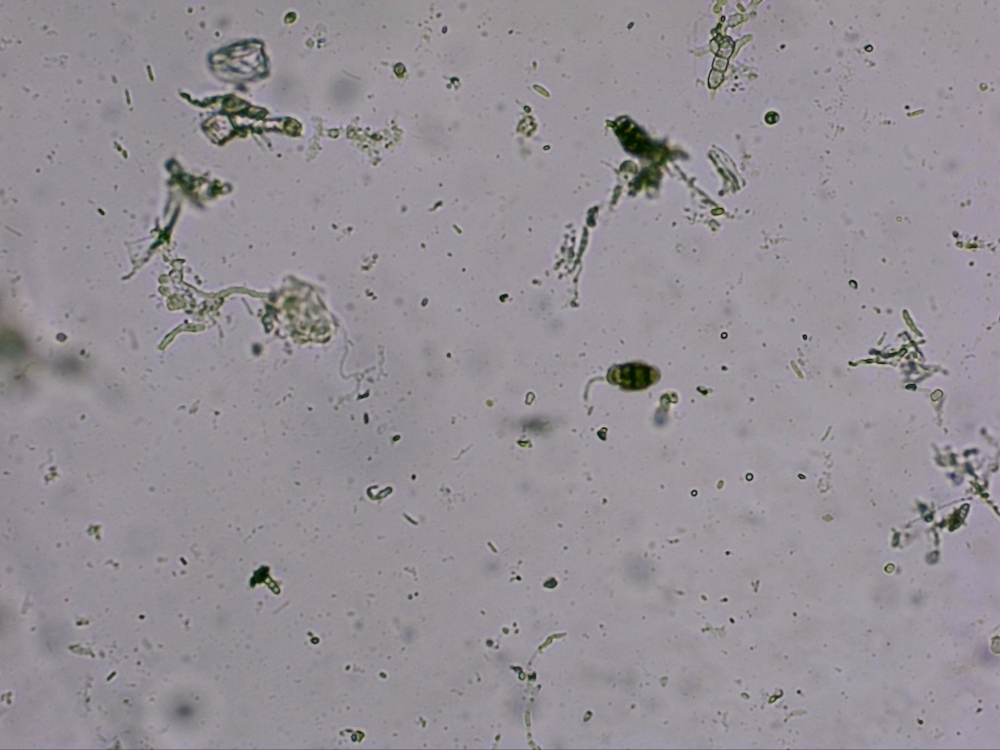

In [6]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/20240423.jpg")

In [7]:
# Yippee it worked. Now to create pathnames from image I.D's
# First turn my "id" in labels to a string
labels_csv["id"] = labels_csv["id"].astype(str)
labels_csv.tail()


,id,spore
1065,20240506_116,se
1066,20240506_117,se
1067,20240506_118,se
1068,20240506_119,se
1069,20240506_120,se


In [8]:
# So I need to get rid of the underscores and try again
spec_chars24 = ["_", "/"]
for char in spec_chars24:
  labels_csv["id"] = labels_csv["id"].str.replace(char, "")
labels_csv.head()

,id,spore
0,20240423,pc
1,202404231,pc
2,202404232,se
3,202404233,pc
4,202404234,pc


In [9]:
# Creating pathnames from image label id's using concantenation now the ID's are strings
filenames = ["drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/" + fname + ".jpg" for
             fname in labels_csv["id"]]
filenames[:5]


['drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/20240423.jpg',
 'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202404231.jpg',
 'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202404232.jpg',
 'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202404233.jpg',
 'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202404234.jpg']

In [10]:
# Check if we have the same number of filenames as actual image files
# Need to import os
import os

In [11]:
len(filenames)

1070

In [12]:
len(os.listdir("drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024"))

1071

In [13]:
# Okay so I've used the label 'id's and turned them into a list of training image file paths
# Now to turn the labels into numbers or booleans
# I'll come back to this problem of 1 more actual image than there are image file paths later on

## Turning Data Labels into Numbers

In [14]:
import numpy as np
labels = labels_csv["spore"]
labels = np.array(labels)
labels

array(['pc', 'pc', 'se', ..., 'se', 'se', 'se'], dtype=object)

In [15]:
len(labels)

1070

In [16]:
len(filenames)

1070

In [17]:
# that's good at least these match up
# let's fine the unique label values
unique_spores = np.unique(labels)
unique_spores

array(['pc', 'se'], dtype=object)

In [18]:
# turn a single label into a boolean array
print(labels[0])
labels[0] == unique_spores



pc


array([ True, False])

In [19]:
# now to turn all our labels into boolean arrays
boolean_labels = [label == unique_spores for label in labels]
boolean_labels[:5]

[array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False])]

In [20]:
# check how many we have
len(boolean_labels)

1070

In [21]:
# now to change them into integers
# true = 1, false = 0
print(labels[0])            # original label
print(np.where(unique_spores == labels[0]))  # this is the index where the label is
print(boolean_labels[0].argmax())   # this is where the label is in our boolean array
print(boolean_labels[0].astype(int)) # this is the label as an integer


pc
(array([0]),)
0
[1 0]


In [22]:
print(labels[2])
print(boolean_labels[2].astype(int))

se
[0 1]


In [23]:
# the first 5 boolean labels
boolean_labels[:5]

[array([ True, False]),
 array([ True, False]),
 array([False,  True]),
 array([ True, False]),
 array([ True, False])]

In [24]:
# Our labels have now been turned into integers or in a numerical format
# Now let's turn to our images or the file paths that represent them
filenames[:5]

['drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/20240423.jpg',
 'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202404231.jpg',
 'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202404232.jpg',
 'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202404233.jpg',
 'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202404234.jpg']

## Creating our own Validation Set

We need a validation set to do our experiments with. It will come from our training set.

In [25]:
# Set up X and y variables
X = filenames
y = boolean_labels

In [26]:
len(filenames)

1070

In [27]:
# There are only just over a 1000 so we'll use all of them
# now to split them into training and validation sets
NUM_IMAGES = len(filenames)

from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(856, 214, 856, 214)

In [28]:
# Let's have a look at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/2024050331.jpg',
  'drive/MyDrive/P Chartarum Vision 2024/spore-type-classification24/train-2024/202405065.jpg'],
 [array([ True, False]), array([ True, False])])

## Pre-processing Images and Labels - Turning them into Tensors

### To preprocess our images into Tensors we're going to create a function which will do these things:



1.   Take an image filepath as input

2.   Use TensorFlow to read the file and and save it to a variable `image`

1.   Turn our `image` (a jpg) into Tensors
2.   Resize the `image` into a shape of (224, 224)

1.   Finally return the modified `image`







In [29]:
# Let's start by importing an image
# We do this by converting it to a numpy array
from matplotlib.pyplot import imread
image = imread(filenames[2])
image.shape

(1944, 2592, 3)

In [30]:
image.max(), image.min()

(225, 0)

In [31]:
tf.constant(image)[2]

<tf.Tensor: shape=(2592, 3), dtype=uint8, numpy=
array([[151, 140, 148],
       [151, 140, 148],
       [152, 141, 149],
       ...,
       [179, 170, 175],
       [176, 167, 170],
       [173, 164, 167]], dtype=uint8)>

In [32]:
# So this is what an image looks like as a Tensor
# now to create our function
# First we need to define our image size

IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor

  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into a numerical Tensor with 3 color channels - Red, Green and Blue
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning Our Data into Batches

We need to do this because our memory is a limited size.

Processing 32 images at a time is ideal.

To use TensorFlow effectively our training data needs to be in the form of Tensor tuples, which look like this:

`(image, label)`


In [33]:
# Let's create a function to retun a tuple `(image, label)`
def get_image_label(image_path, label):
  """
Takes an image file path name and the associated label, processes the
image and retunrs a tuple of (image, label).

  """
  image = process_image(image_path)
  return image, label

In [34]:
# A demonstration of this function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.6392157 , 0.6156863 , 0.6313726 ],
         [0.6319328 , 0.62287915, 0.6281513 ],
         [0.61337537, 0.6055322 , 0.6251401 ],
         ...,
         [0.6461584 , 0.6187074 , 0.65007997],
         [0.66821724, 0.61561614, 0.6553721 ],
         [0.65016997, 0.6004501 , 0.67040807]],
 
        [[0.64556825, 0.62203884, 0.62203884],
         [0.6319328 , 0.62633055, 0.61904764],
         [0.63658464, 0.6287415 , 0.6405062 ],
         ...,
         [0.6479295 , 0.6204785 , 0.65185106],
         [0.6413965 , 0.61394554, 0.6453181 ],
         [0.65770245, 0.60896426, 0.6784314 ]],
 
        [[0.65364146, 0.63235295, 0.6379752 ],
         [0.61491597, 0.6104342 , 0.6042717 ],
         [0.6179272 , 0.61008406, 0.62184876],
         ...,
         [0.6737395 , 0.64705884, 0.6721989 ],
         [0.62878144, 0.60133046, 0.632703  ],
         [0.6632381 , 0.6166197 , 0.6697608 ]],
 
        ...,
 
        [[0.63661456, 0.6091636 

In [35]:
# In the last cell we turned our image 42 and label 42 into a tensor tuple
# The first bit of code is the image tensor with shape = (224,224,3)
# And the second is label 42 with True being in the 0 index. It's a spore/not a spore.


We can turn our data now into tuples of Tensors in the form: `(image, label)`.

Now to create a function to turn our different types of data into batches.

Our test data doesn't have any labels so we'll need different code for that.

We treat our training/validation data differently too. It's randomized so our model gets to learn more quickly?

In [36]:
# First define batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input which has no labels.

  """
  # if the data is a test dataset we probably won't have any labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a validation dataset we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) #filepaths and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # for our training dataset which we do want to shuffle
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffle the data
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples which also turns the image path into a preprocessed image
    data = data.map(get_image_label)
    # Now to turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch



In [37]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [38]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

In [39]:
# In the cell above we have training image, label tuples in the form of Tensors
# as well as validation images and labels specified in the 3rd and 4th lines
# labels have a dimension of 1 with 2 possible entries, one each for the two unique 'spores'
y[0]

array([ True, False])

## Visualizing Our Data

### To do this we need to create a function for viewing say, 25 images together with their labels in a 5 x 5 plot, using Matplot Lib.

In [40]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images from a data batch.

  """
  # Set up the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots of 5 rows and 5 columns
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # And the image label as the title
    plt.title(unique_spores[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")



In [41]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))>

In [42]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

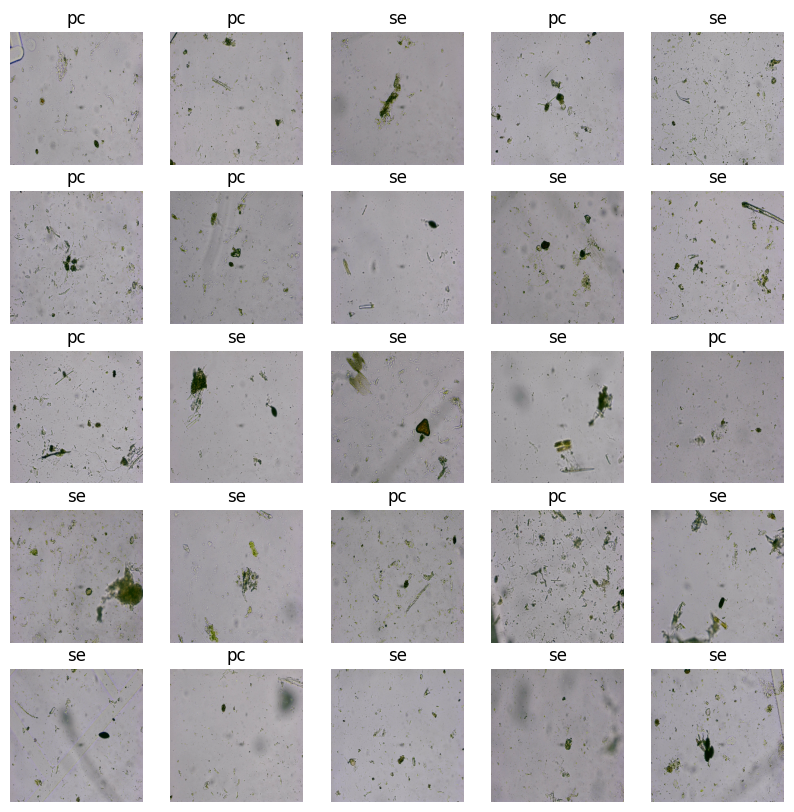

In [43]:
# lets visualize the data in a training batch
show_25_images(train_images, train_labels)

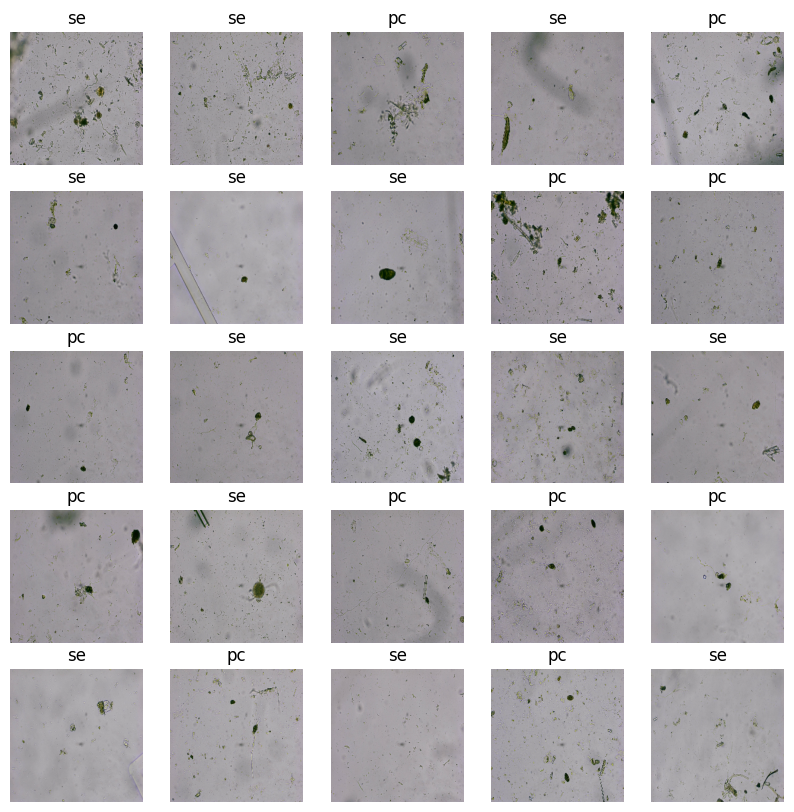

In [44]:
# And our validation images
val_image, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_image, val_labels)


In [45]:
# The validation images stay the same if we rerun the cell but the training ones get shuffled

## Preparing Our Inputs and Outputs

We need to do this step before building our Deep Learning Model.

And must define some things:


1.   The input shape (our images shape, in the form of Tensors) to our model.
2.   The output shape (image labels, in the form of Tensors) to our model.
1.   The URL of the model we want to use






In [46]:
# Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Set up output shape to our model
OUTPUT_SHAPE = len(unique_spores)

# Set up model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/resnet-v2/TensorFlow2/101-classification/2"



Now we've got our inputs, outputs and model ready to go, let's put them together into a Keras Deep Learning model.

We need to create a function which:


*   Takes the input shape, the output shape and the model we've chosen as parameters
*   Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).


*   Compiles the model (says how it is to be evaluated and improved)
*   Builds the model (tells the model the input shape it will be getting)


*   Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview







In [47]:
# Create a function which builds a Keras model
# First upgrade tensorflow_hub

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="sigmoid")
      ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.BinaryCrossentropy(), # Binary labels
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)

  return model



In [48]:


# Lets see what happens
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/resnet-v2/TensorFlow2/101-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              44677609  
                                                                 
 dense (Dense)               (None, 2)                 2004      
                                                                 
Total params: 44679613 (170.44 MB)
Trainable params: 2004 (7.83 KB)
Non-trainable params: 44677609 (170.43 MB)
_________________________________________________________________


In [49]:
# YAY!! finally

## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save it's progress, check it's progress or stop training early if the model stops improving.

We'll create two callbacks one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.


### TensorBoard Callback

To set up a TensorBoard Callback we need to do three things:


1.   Load the TensorBoard notebook extension
2.   Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
1.   Visualize our models training logs with the `%tensorboard` magic function. We'll do this after model training






In [50]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [51]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/P Chartarum Vision 2024/spore-type-classification/logs",
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [52]:
# Create an early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model.

Usually on a subset of data but we have a relatively small amount of it so will use all 1070 images and labels.



In [53]:
NUM_EPOCHS = 100

In [54]:
# Check to make sure we're still running on GPU
print("GPU", "available : ) " if tf.config.list_physical_devices("GPU") else "not availabe")

GPU available : ) 


In [55]:
# Let's create a function which will train a model
def train_model():
  """
  Trains a given model and returns the trained version.

  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [56]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/resnet-v2/TensorFlow2/101-classification/2
Epoch 1/100
27/27 [==============================] - 85s 3s/step - loss: 0.8139 - accuracy: 0.5794 - val_loss: 0.6817 - val_accuracy: 0.6355
Epoch 2/100
27/27 [==============================] - 55s 2s/step - loss: 0.6596 - accuracy: 0.6530 - val_loss: 0.6518 - val_accuracy: 0.6402
Epoch 3/100
27/27 [==============================] - 67s 2s/step - loss: 0.6421 - accuracy: 0.6565 - val_loss: 0.6507 - val_accuracy: 0.6729
Epoch 4/100
27/27 [==============================] - 66s 2s/step - loss: 0.6160 - accuracy: 0.6764 - val_loss: 0.6139 - val_accuracy: 0.6869
Epoch 5/100
27/27 [==============================] - 66s 2s/step - loss: 0.5995 - accuracy: 0.6869 - val_loss: 0.5961 - val_accuracy: 0.6636
Epoch 6/100
27/27 [==============================] - 59s 2s/step - loss: 0.5955 - accuracy: 0.7068 - val_loss: 0.6008 - val_accuracy: 0.6822
Epoch 7/100
27/27 [==============================] - 

## Saving our Trained Model and Reloading it


In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):

  """
Saves a given model in a models directory and appends a suffix or string.

  """
  # Create a model directory pathname with a current time
  modeldir = os.path.join("drive/MyDrive/P Chartarum Vision 2024/spore-type-classification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}.....")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
Loads a saved model from a specified path.

  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path.
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

SyntaxError: expression cannot contain assignment, perhaps you meant "=="? (<ipython-input-59-cabbd30ccab5>, line 8)

In [ ]:
# Okay what now? It's the 8th September
# My latest model ran for 9 Epochs. Both training and validation losses were still high and nowhere near 0
# Accuracy approx. 70% for training and peaked at Epoch 6 - 73%, for validation
# The best last year using the grid images was this and this
# The validation metrics and loss were worse than the training ones by the time it got to the last epoch
# This means that the model is learning something from the training data I think


In [57]:
%tensorboard --logdir drive/My\ Drive/P\ Chartarum\ Vision\ 2024/spore-type-classification/logs


<IPython.core.display.Javascript object>

## Checking TensorBoard logs

### The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize it's contents - check out the image above

### Now to experiment with a different mobilenet_v2 sequential model



In [ ]:
# So I tried using "035- 128, 160 and 192-classification" models - neither of them worked
# But a resnet_v2 101-classification did
# Looking at the TensorBoard the 035-128-224 is performing best so far especially on it's second run
# I'll run it again tomorrow and see if it improves more